# GG4257 - Urban Analytics: A Toolkit for Sustainable Urban Development

## Lab Assignment 2: Networks and Geodemographics

# Cover Page

Student ID: 200016001

Module Code: GG4257

Module Title: Urban Analytics: A Toolkit for Sustainable Urban Development

Assignment: Assignment 2

Degree Programme: Geography and Sustainable Development

Deadline Date: March 14th 2024

Declaration: In submitting this assignment, I hereby confirm that I have read the University's statement on Good Academic Practice. The following work is my own. Significant academic debts and borrowings have been properly acknowledged and referenced.

# Introduction - How to replicate the code and get the required data

GitHub Repo: https://github.com/SeanH0122/GG4257_Assignment_2

Data (Google Drive): https://drive.google.com/drive/folders/1NLUDFLApKDtJWGdxXIoAvG0yKjJ_wnyE?usp=sharing

All the data needed for the assignment is in the drive folder above. Download the relevant data to a local folder titled 'GG4257_Assignment_2' when running the below code. Replicate the folder & file names in the Drive, otherwise paths may have to be changed depending on the names.

# Lab 5 Challenges

## Challenge 1

It's time for you to apply everything you learned by analyzing a case study of GitHub's collaborator network data.

- **Data**: `github_users.p` (avaliable in Moodle)

> This dataset is a GitHub user collaboration network. As you already know, GitHub is a social coding site where users can collaborate on code repositories. In this network, nodes are users, and edges indicate that two users are collaborators on at least one GitHub repository.

1. Read the GitHub network dataset.
2. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network
3. Calculate the **degree centrality** of the GitHub collaboration network G. Using the .values() method of the network (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the network.
4. Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. Experiment with multiple nodes so you have a graph with enough edges to work on.
5. Plot the subset graph created.
6. Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`
7. Plot the Matrix, Arc and Circos from the subset.

### 1.1 Load & Read the Data

In [ ]:
import pickle

In [ ]:
with open('Lab_5/github_users.p', 'rb') as f:
    X = pickle.load(f)
X

### 1.2 Basic Functions of the Graph's Size

In [ ]:
print(len(X)) # size of the graph

print(len(X.nodes)) # number of nodes present

print(len(X.edges)) # number of edges present

### 1.3 Degree Centrality

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

In [ ]:
degree_centrality = nx.degree_centrality(X) # calculate degrees of centrality
centrality_values = list(degree_centrality.values()) # extract values and convert to list

# plot histogram
plt.hist(centrality_values, bins=10)
plt.title('Distribution of Degree Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.show()

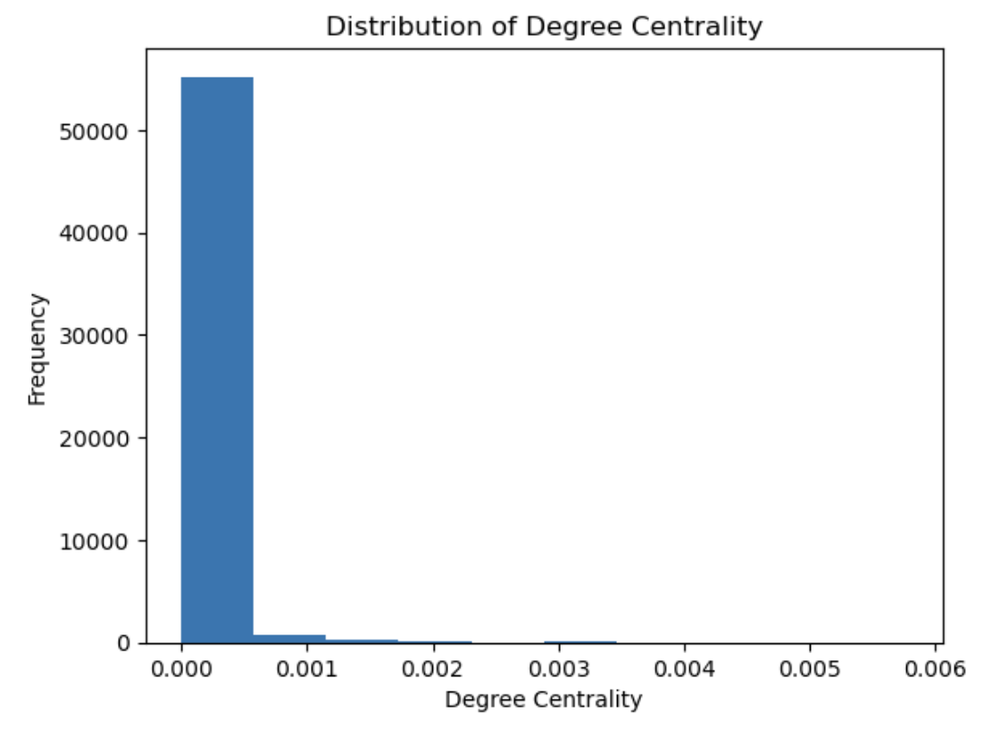

### 1.4 Network Subset

In [ ]:
subset_nodes = list(X.nodes())[9:12] # filter a subset of nodes

subset_edges = X.edges(subset_nodes) # select edges from those nodes

Gh_sub = nx.Graph(subset_edges) # create graph with subsetted edges

### 1.5 Plot the Subset

In [ ]:
# plot the graph
Gh_sub_graph = nx.spring_layout(Gh_sub)
nx.draw(Gh_sub, Gh_sub_graph, with_labels=True, node_size=100, node_color='skyblue')
plt.title('GitHub Subset of Users')
plt.show()
# note that the graph may look different, but the data is the same

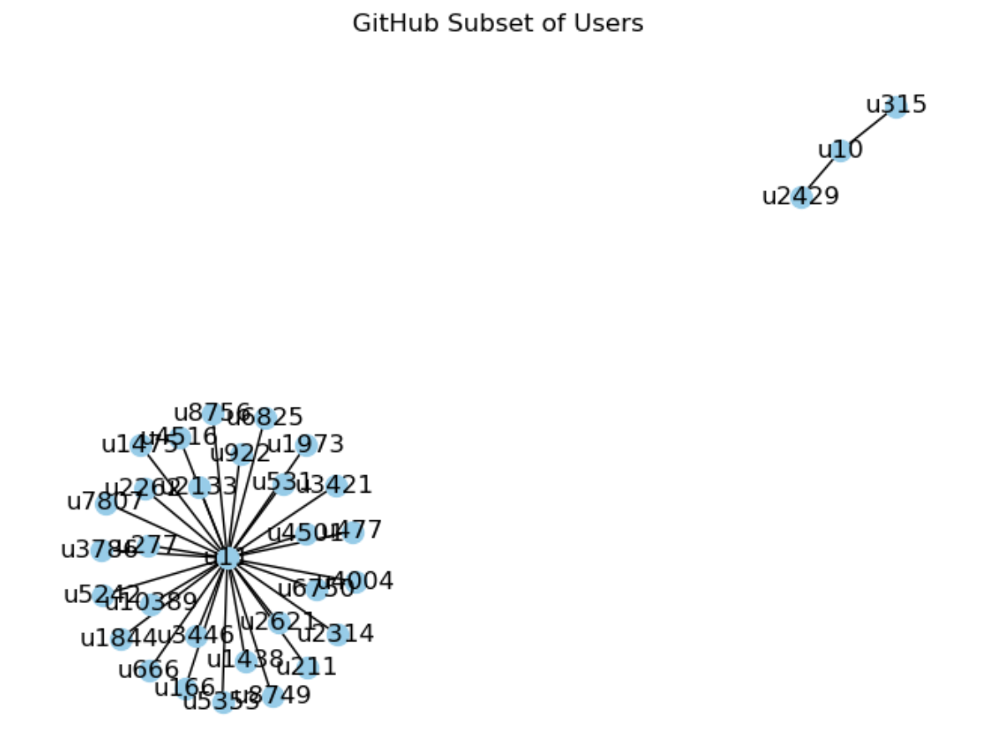

### 1.6 Betweenness Centrality

In [ ]:
betweenness_centrality = nx.betweenness_centrality(Gh_sub) # calculate betweenness centrality

# extract values and convert to list
betweenness_values = list(betweenness_centrality.values())

# plot and format histogram
plt.hist(betweenness_values, bins=10)
plt.title('Distribution of Betweenness Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.show()

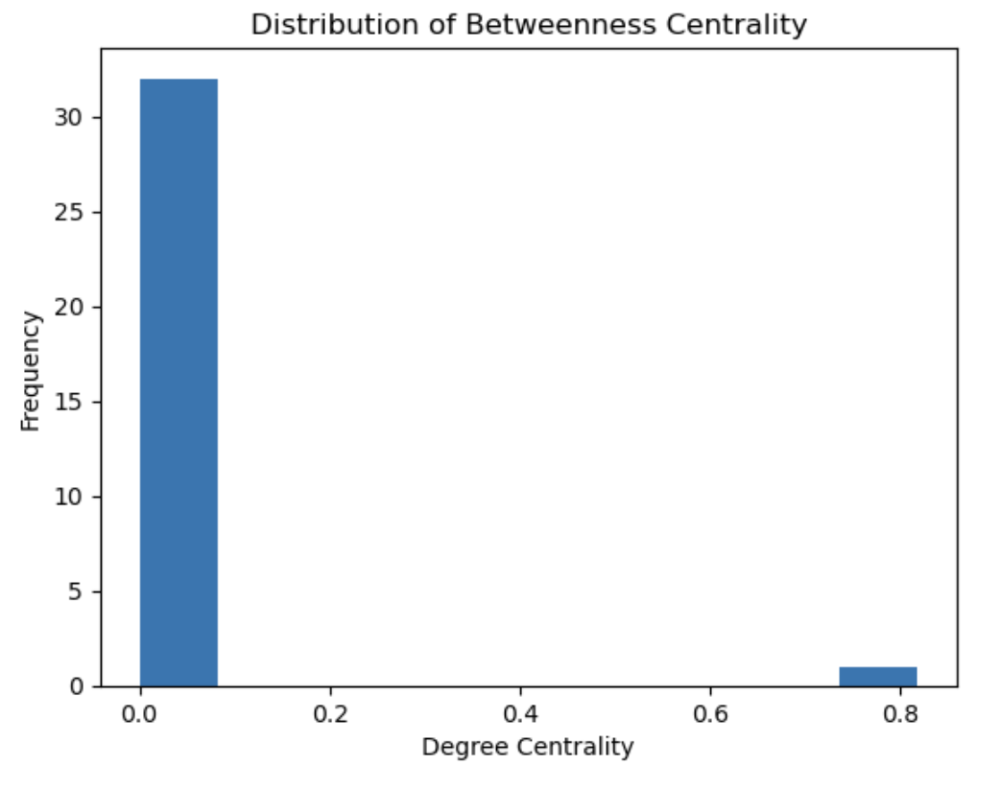

### 1.7 Matrix, Arc, and Circos Plots

In [ ]:
import nxviz as nv

In [ ]:
# plot matrix
nv.MatrixPlot(Gh_sub)
plt.show()

# plot Arc
nv.ArcPlot(Gh_sub)
plt.show()

# plot Circos
nv.CircosPlot(Gh_sub)
plt.show()

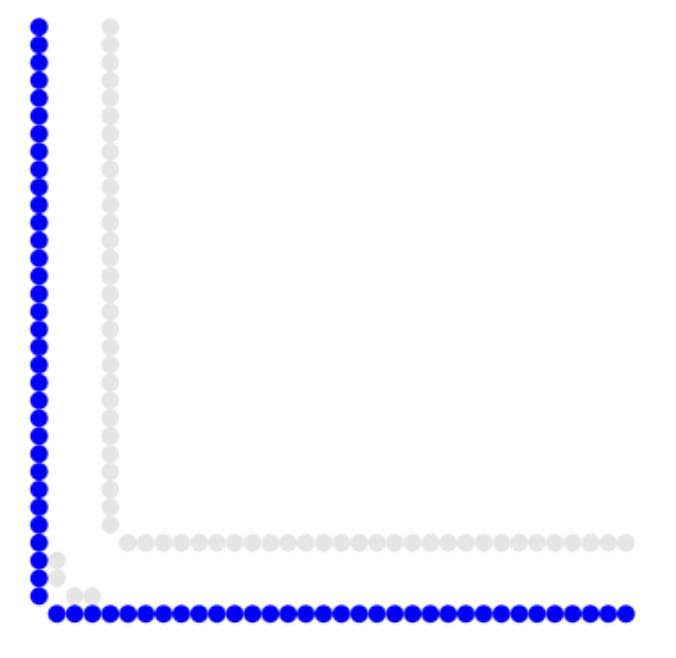
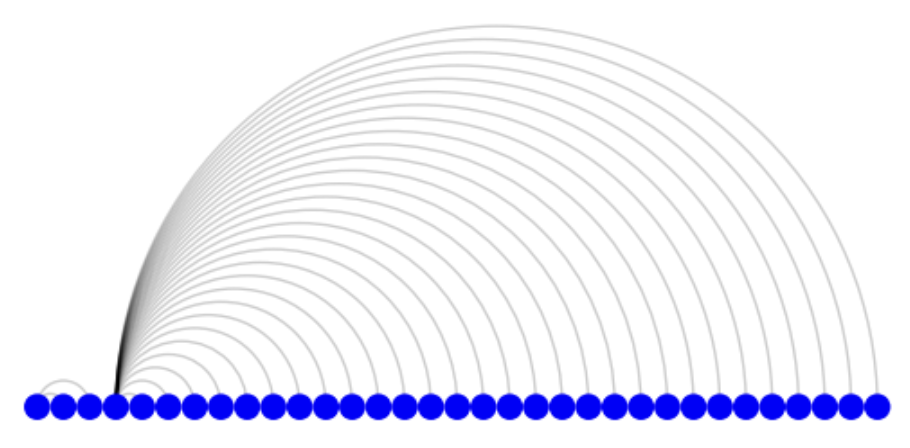
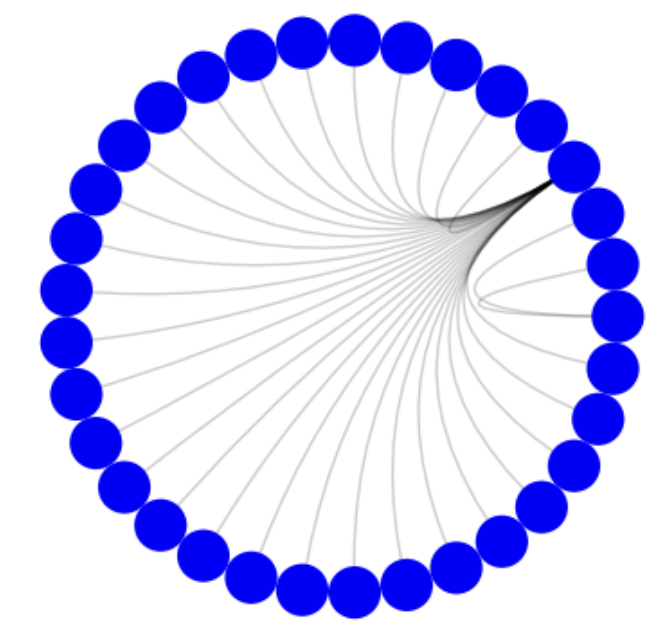

## Challenge 2

This challenge is about OSMnx. You will explore and analyze a city's street network using the OSMnx Python library.

1. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.
2. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.
3. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot
4. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.
5. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.
6. Create the figure-groud from the selected city
7. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.
8. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.
9. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

### 2.1 Select City

I have selected Hong Kong as the city I will explore

In [ ]:
import osmnx as ox

In [ ]:
hk = ox.graph_from_place("Hong Kong", network_type="drive") # import street network

### 2.2 Calculate Basic Stats

In [ ]:
hk_proj = ox.project_graph(hk) # project the graph

nodes_proj = ox.graph_to_gdfs(hk_proj, edges=False) # convert to geodataframe, taking only nodes

graph_area_m = nodes_proj.unary_union.convex_hull.area # create single geometric object, calculate area and output stats

ox.basic_stats(hk_proj, area=graph_area_m, clean_int_tol=15) # output stats: 'n' = Node Count, 'm' = Edge Count

### 2.3 Plot Street Network

In [ ]:
fig, ax = ox.plot_graph(hk, figsize=(10, 10), node_size=1, edge_color="skyblue", edge_linewidth=0.3) # plot street network, customising node size & edge colour

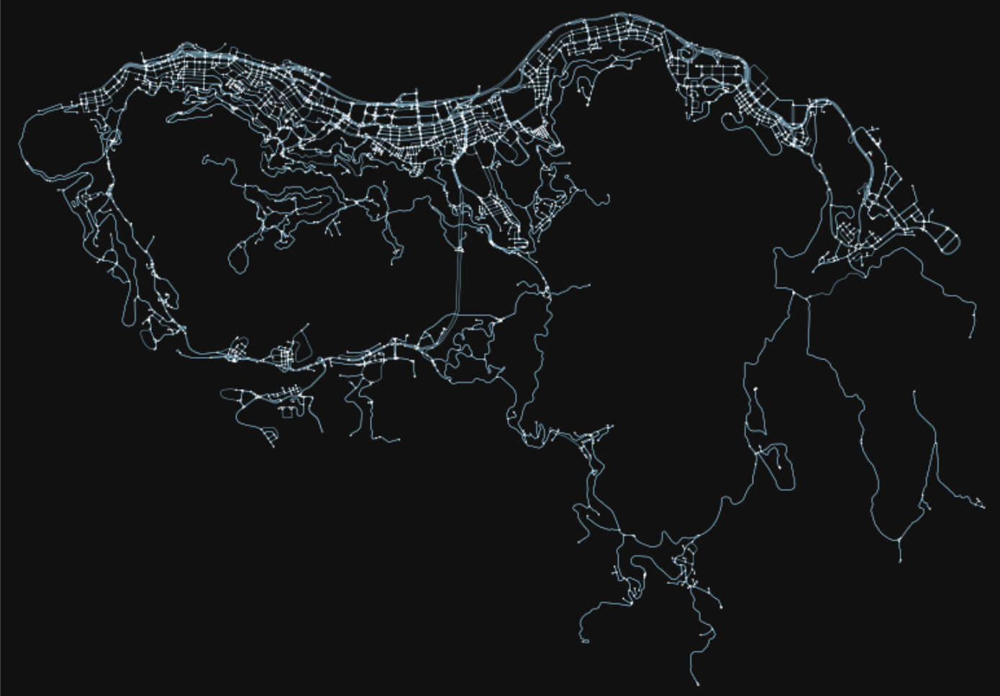

### 2.4 Calculate Shortest Path

I will calculate the distance between the Central Ferry Pier and the Shek O Golf Club 

Central Ferry Pier: https://en.wikipedia.org/wiki/Central_Piers

Shek O Golf Club: https://www.golfinhongkong.com/golf-courses/shek-o-country-club/

In [ ]:
hk = ox.speed.add_edge_speeds(hk) # add speed
hk = ox.speed.add_edge_travel_times(hk) # add travel time

orig_hk = ox.distance.nearest_nodes(hk, X=114.1554602, Y=22.2873796) # select & define first location (Central Ferry Pier)
dest_hk = ox.distance.nearest_nodes(hk, X=114.2493811, Y=22.234751) # select & define second location (Shek O Golf Club)

route_hk = ox.shortest_path(hk, orig_hk, dest_hk, weight="travel_time") # calculate shortest path between nodes
fig, ax = ox.plot_graph_route(hk, route_hk, node_size=1) # plot the path over the network

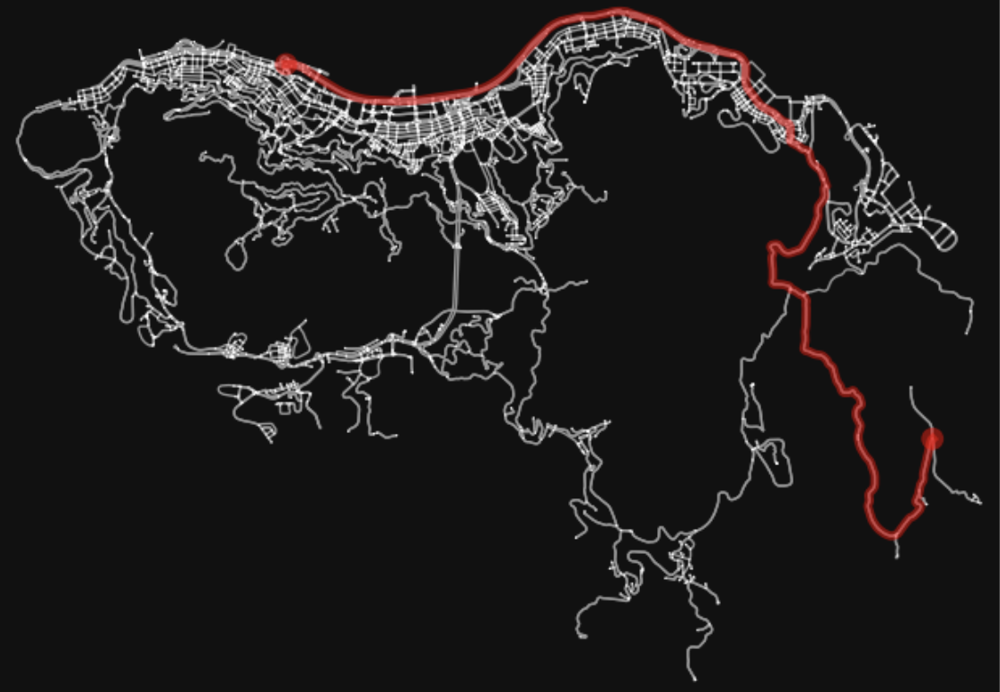

### 2.5 Calculate Centrality Measures

In [ ]:
degree_centrality_hk = nx.degree_centrality(hk) # calculate degree centrality

centrality_values = list(degree_centrality_hk.values()) # extract values & convert to list

#plot and format histogram of values
plt.hist(degree_centrality_hk, bins=10)
plt.title('Distribution of Degree Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.show()

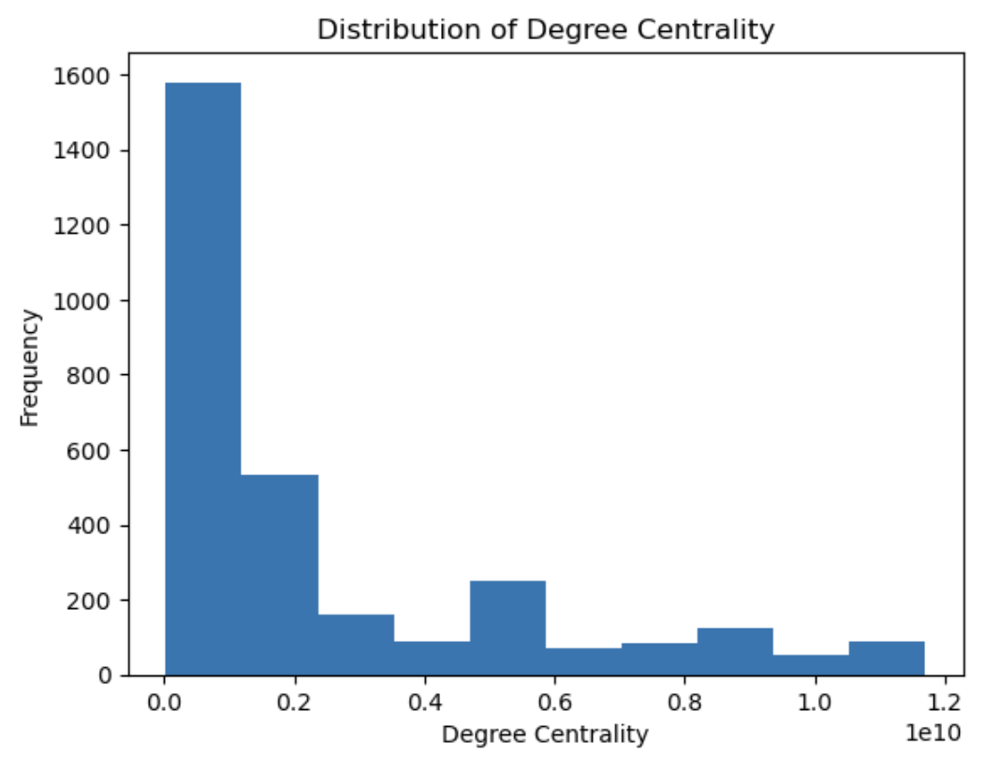

In [ ]:
btw_centrality_hk = nx.betweenness_centrality(hk) # calculate betweenness centrality

betweenness_values = list(btw_centrality_hk.values()) # extract values & convert to list

#plot and format histogram of values
plt.hist(betweenness_values, bins=10)
plt.title('Distribution of Betweenness Centrality')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.show()

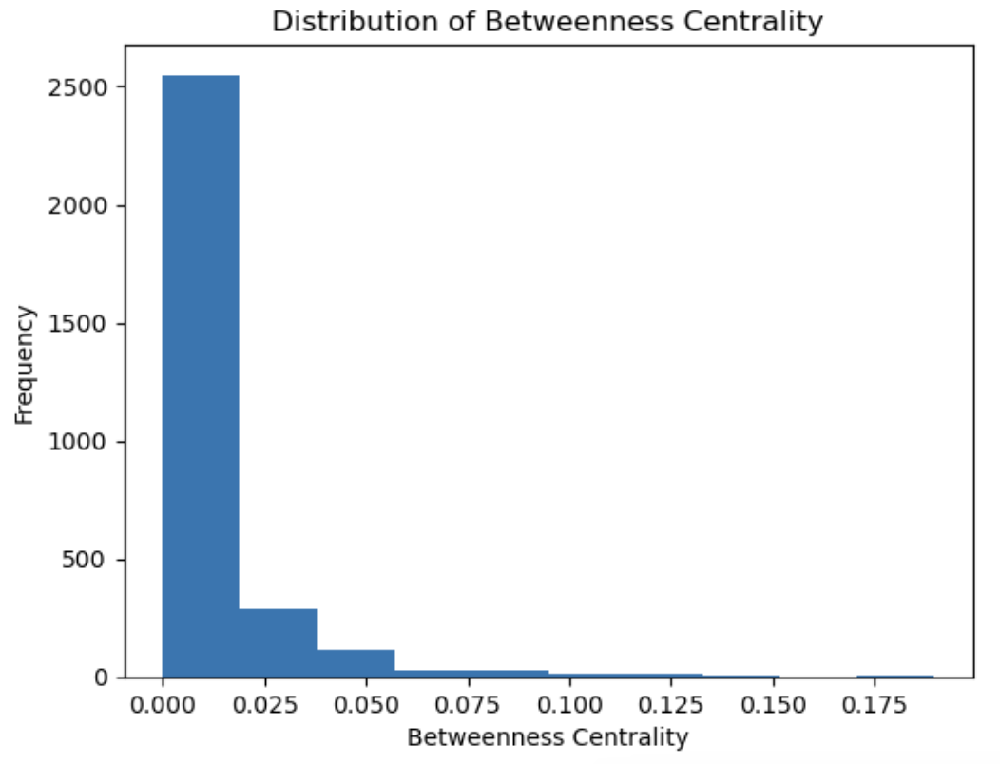

### 2.6 Create Figure Ground

In [ ]:
from IPython.display import Image

In [ ]:
# configure online image display
img_folder = "images"
extension = "png"
size = 300
dpi = 40

In [ ]:
# create and plot figure ground
place = "Hong Kong Central Ferry Pier"
point = (22.2873796, 114.1554602)
fp = f"./{img_folder}/{place}.{extension}"
fig, ax = ox.plot_figure_ground(
    point=point,
    network_type="drive",
    filepath=fp,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)
Image(fp, height=size, width=size)

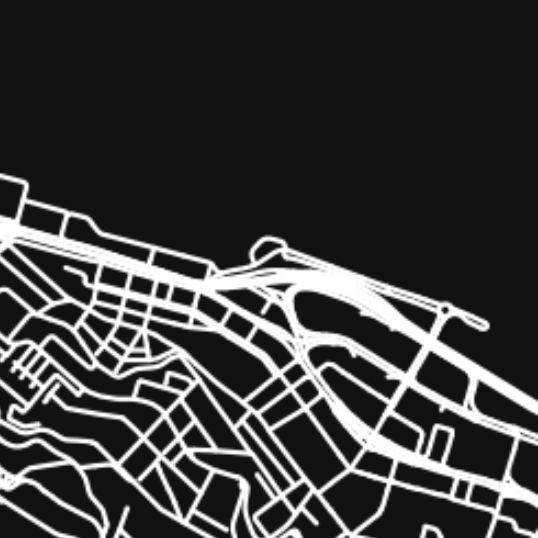

### 2.7 Interactive Maps

In [ ]:
ox.graph_to_gdfs(hk, nodes=False).explore() # explore interactive map

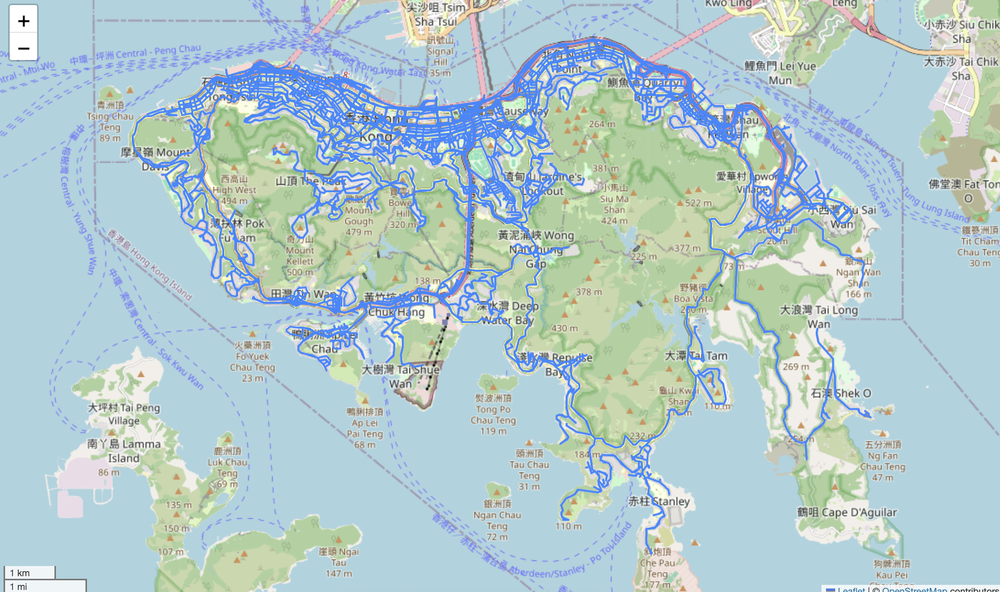

In [ ]:
# explore interactive map, changing basemap tiles
nodes_hk = ox.graph_to_gdfs(hk, edges=False)
nodes_hk.explore(tiles="cartodbdarkmatter", color="skyblue", marker_kwds={"radius": 2})

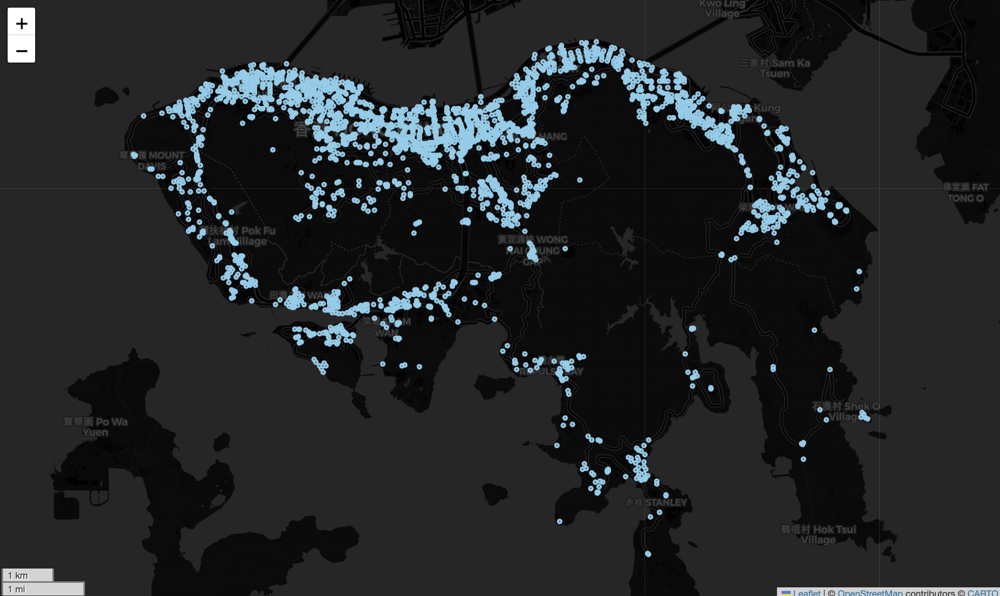

In [ ]:
# explore nodes and edges in a single map
nodes_hk, edges_hk = ox.graph_to_gdfs(hk)
map_hk = edges_hk.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes_hk.explore(m=map_hk, color="pink", marker_kwds={"radius": 1})

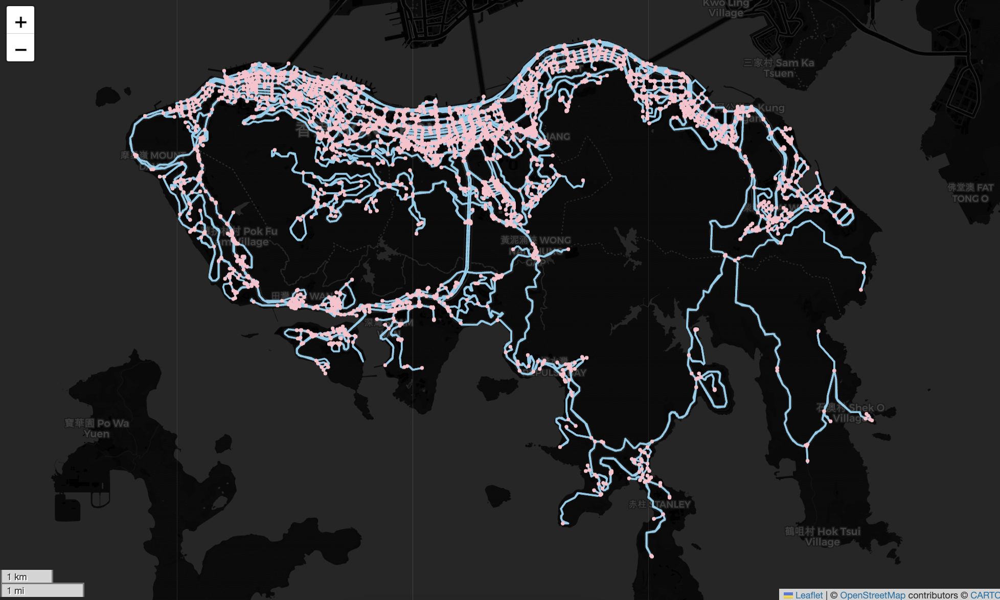

In [ ]:
# explore graph nodes interactively, colored by betweenness centrality
nx.set_node_attributes(hk, nx.betweenness_centrality(hk, weight="length"), name="bc")
nodes_hk = ox.graph_to_gdfs(hk, edges=False)
nodes_hk.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 2})

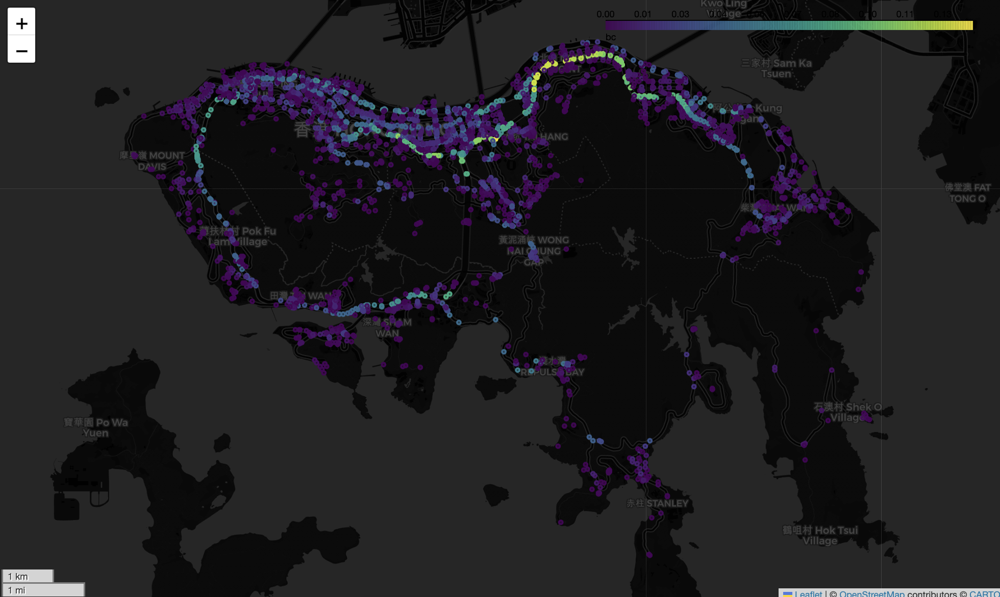

### 2.8 Export to GeoPackage File

In [ ]:
# Save graph to disk as geopackage (for GIS) or graphml file (for gephi, etc)
ox.save_graph_geopackage(hk, filepath="./Lab_5/HKnetwork.gpkg")
ox.save_graphml(hk, filepath="./Lab_5/HKnetwork.graphml")

In [ ]:
import geopandas as gpd

In [ ]:
# load in the data
gdf = gpd.read_file("Lab_5/HKnetwork.gpkg")
gdf.head()

In [ ]:
edges_hk = gpd.read_file("Lab_5/HKnetwork.gpkg", layer="edges") # define edges
nodes_hk = gpd.read_file("Lab_5/HKnetwork.gpkg", layer="nodes") # define nodes

# create interactive map of edges & nodes
nodes_hk, edges_hk = ox.graph_to_gdfs(hk) 
map_hk = edges_hk.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes_hk.explore(m=m_hk, color="pink", marker_kwds={"radius": 1})

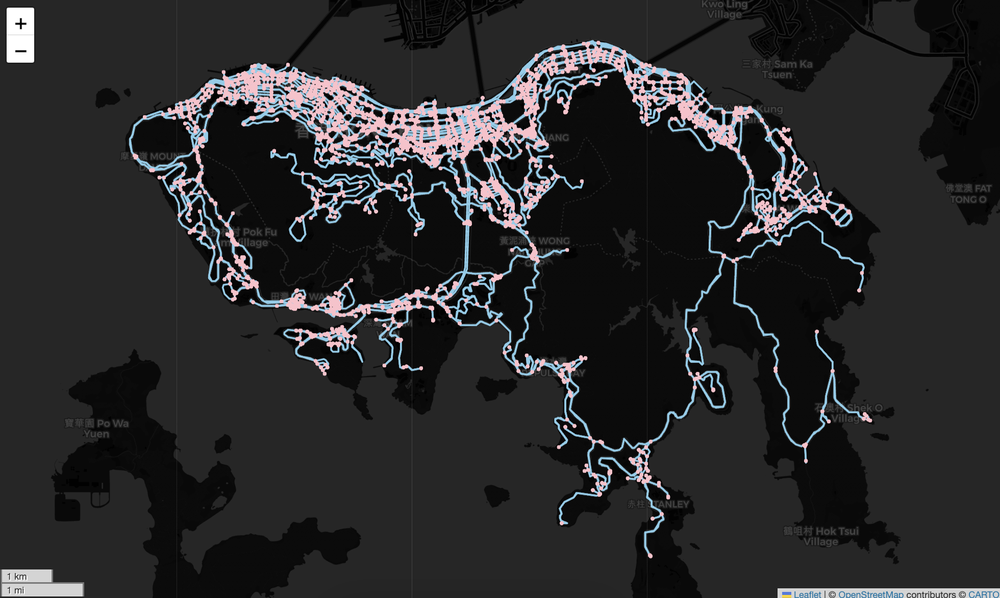

### 2.9 Extract & Plot Urban Elements

In [ ]:
place = "Hong Kong" # define location

tags = {"building": True} # extract buildings using tag
gdf = ox.geometries_from_place(place, tags)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10)) # plot buildings

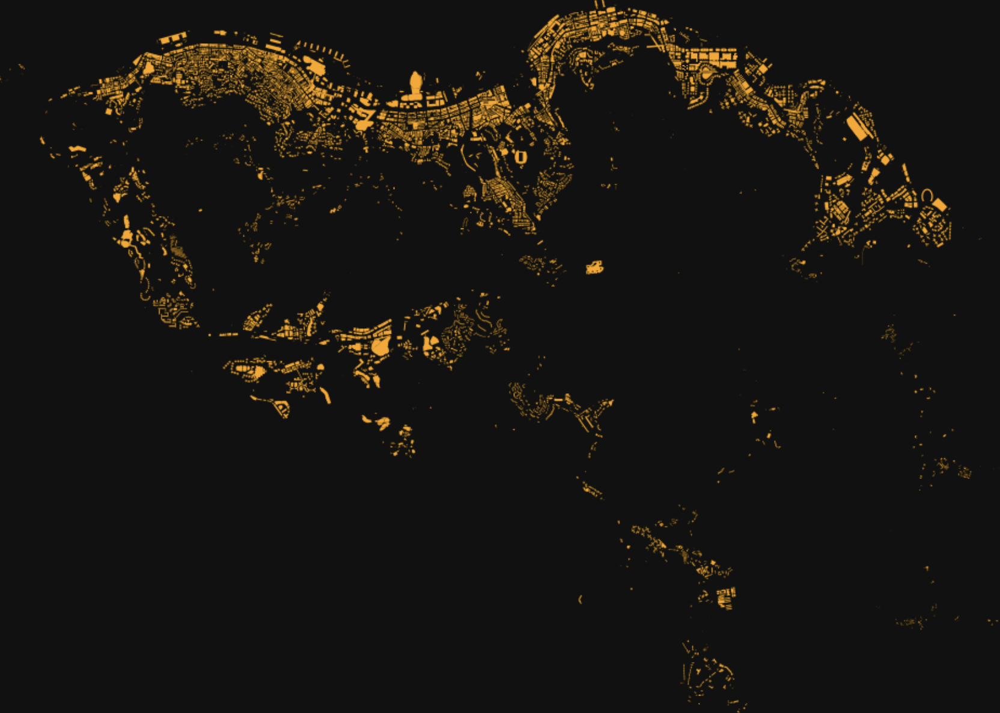

In [ ]:
tags = {"railway": True} # extract railways using tag
gdf = ox.geometries_from_place(place, tags)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10)) # plot railways

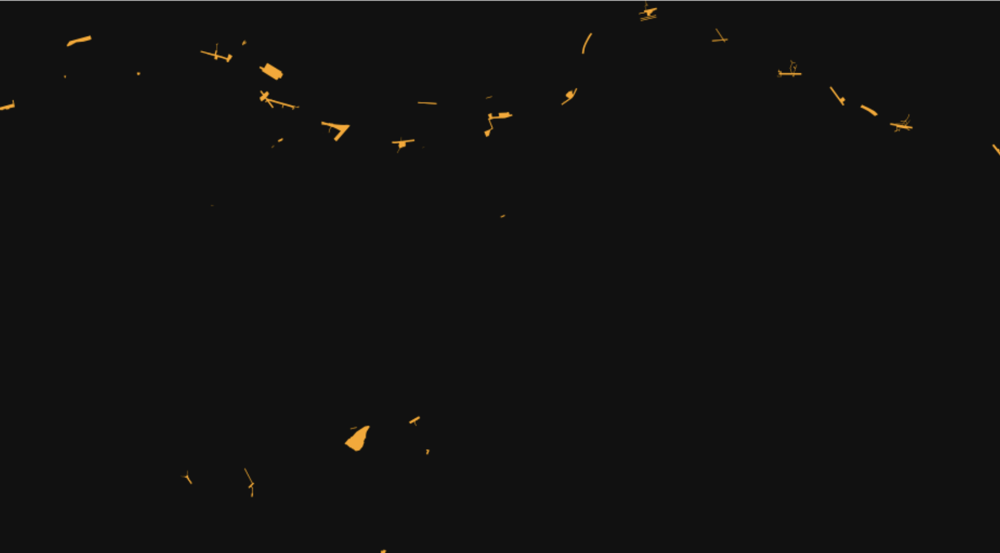

In [ ]:
tags = {"park": True} # extract parks using tag
gdf = ox.geometries_from_place(place, tags)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10)) # plot parks

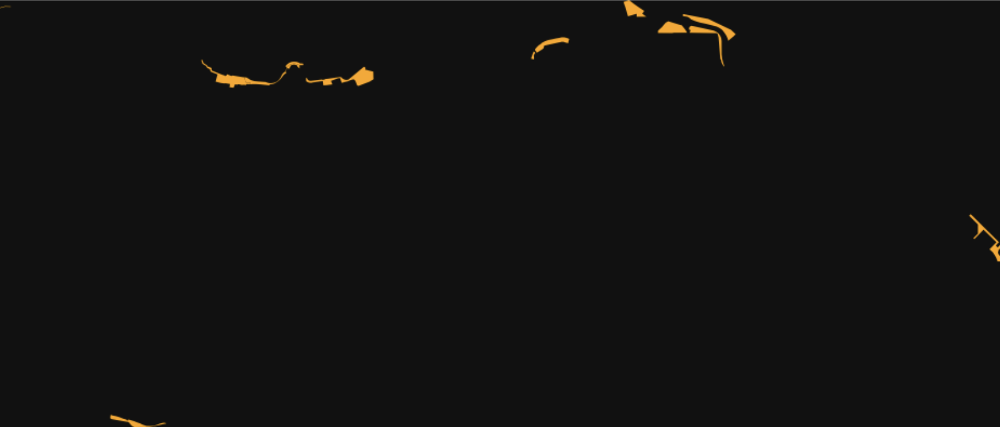

# Lab 6 Challenges

# Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

### 1.1 Main Goal

The goal for this geodemographic classification is to inform elderly healthcare services in Edinburgh. 

### 1.2 Census Data

Census Data from Scotland's 2011 Census Data on the City of Edinburgh is used. 

### 1.3 & 1.4 Selected Topics & Variables

* KS102SC - Age structure - Demographics
* Purpose: Identify areas with higher concentrations of the elderly population, which may indicate a greater need for healthcare services.
    * 65 to 74
    * 75 to 84
    * 85 to 89
    * 90 and over
* QS104SC - Sex - Demographics
* Purpose: Understand the gender distribution, as some health conditions may be more prevalent in one gender.
    * Females
    * Males 
* QS302SC - General Health - Health
* Purpose: Gauge the overall health status of the elderly population, identifying areas with greater needs for healthcare services.
    * Good health
    * Bad health
* QS304SC - Long Term Health Conditions
* Purpose: Highlight the prevalence of long-term health conditions to tailor healthcare services appropriately.
    * No condition
    * Physical Disability
    * Mental Health Condition
* KS601SC - Economic activity - Economic
* Purpose: Identify the proportion of the elderly population that is retired, which may influence their healthcare needs and service usage.
    * Economically active: Employee: Full-time
    * Economically inactive: Retired
* KS601SCb - Adults not in employment and dependent children
* Purpose: Assess the socioeconomic status and potential impact on healthcare needs and accessibility.
    * No adults in employment in household: With dependent children
    * Dependent children in household: All ages
* KS402SC - Household Tenure
* Purpose: Understand housing stability and its potential impact on health and access to healthcare services.
    * Owned: Owned outright
    * Rented: Council (Local Authorities)
    * Rented: Private landlord or letting agency
 
This selection of topics & variables is well suited to understand the range of socio-economic factors that would impact how elderly healthcare services should be implemented. By understanding the distribution of the elderly, along with their economic status, this will help the local authorities understand where to invest efforts into supporting the elderly population. Generally, areas with a greater volume of elderly that are economically disadvantaged will need the greatest amount of support. This is because they will have limited access to private healthcare options.

### 1.5 Prepare the Data

The datasets downloaded required preprocessing which was completed in Excel.

In [ ]:
import pandas as pd
import os

In [ ]:
csv_directory = "Lab_6/Census_Data" # link to census data file

csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")] # list all CSV files

merged_data = pd.DataFrame() # create empty DataFrame

# loop through each CSV file
for csv_file in csv_files: 
    csv_path = os.path.join(csv_directory, csv_file) 
    df_csv = pd.read_csv(csv_path, low_memory=False) 
    merged_data = pd.concat([merged_data, df_csv], axis=1)

merged_data.to_csv("Lab_6/Merged_Census_Data.csv", index=False) # save merged dataset

In [ ]:
# link to Edinburgh output areas
shp_path = "Lab_6/Edinburgh_OA/scotland_oa_2011.shp"
gdf = gpd.read_file(shp_path)

# link to merged CSV file
csv_path = "Lab_6/Merged_Census_Data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

# merge GeoDataFrame with DataFrame with OA_Code
merged_data = gdf.merge(csv_data, left_on='code', right_on='oa_code', how='left')

# save data to shapefile
merged_data.to_file('Lab_6/Merged_Shape/merged_data.shp', index=False)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# plot histograms and violin graphs of key attributes

attributes_to_plot = ['Owned: Owned outright',
                      'Males',
                      'Economically inactive: Retired',
                      '65 to 74',
                      'Physical disability']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 3, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 3, i)
    merged_data[attribute] = pd.to_numeric(merged_data[attribute], errors='coerce')
    sns.violinplot(x=merged_data[attribute])
    plt.title(attribute)

plt.tight_layout()
plt.show()

The above graphs show there is a high degree of variability in the dataset and are not normally distributed. This will inform how NaN variables are filled in later. 

### 1.6 Standardisation of Areas

Given the variation in population and household counts across output areas, it's crucial to standardize values to enable comparison across these areas. This involves transforming each variable into a percentage of the area's total, achieved by identifying the total and the value column for each variable, which vary due to data originating from diverse datasets. Percentages are subsequently calculated based on these figures.

In [ ]:
list(merged_data.columns)

In [ ]:
# function that creates a new dataframe
def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
            
        # convert value & total columns to numerics, create NaNs for missing data
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        # create percentage from value column and total columns
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# list total columns
total_cols = ['All people',
              'All people',
              'All people',
              'All people',
              'All people.1',
              'All people.1',
              'All people.3',
              'All people.3',
              'All people.2',
              'All people.2',
              'All people.2',
              'All people aged 16 to 74',
              'All people aged 16 to 74',
              'All households',
              'All households',
              'All households.1',
              'All households.1',
              'All households.1',
              ]

# list corresponding value columns
value_cols = [
     '65 to 74',
     '75 to 84',
     '85 to 89',
     '90 and over',
     'Males',
     'Females',
     'Good health',
     'Bad health',
     'No condition',
     'Physical disability',
     'Mental health condition',
     'Economically active: Employee: Full-time',
     'Economically inactive: Retired',
     'Dependent children in household: All ages',
     'No adults in employment in household: With dependent children',
     'Owned: Owned outright',
     'Rented: Council (Local authority)',
     'Rented: Private landlord or letting agency',
             ]

# run function with total and value columns
result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)

In [ ]:
# combine new results dataframe with merged data
concatenated_df = pd.concat([merged_data, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

In [ ]:
list(concatenated_df.columns)

In [ ]:
# list standardised and geometry data requires for future analysis
keep_cols = [
    'code',
    'popcount',
    'hhcount',
    'geometry',
    '65 to 74_percentage',
    '75 to 84_percentage',
    '85 to 89_percentage',
    '90 and over_percentage',
    'Males_percentage',
    'Females_percentage',
    'Good health_percentage',
    'Bad health_percentage',
    'No condition_percentage',
    'Physical disability_percentage',
    'Mental health condition_percentage',
    'Economically active: Employee: Full-time_percentage',
    'Economically inactive: Retired_percentage',
    'Dependent children in household: All ages_percentage',
    'No adults in employment in household: With dependent children_percentage',
    'Owned: Owned outright_percentage',
    'Rented: Council (Local authority)_percentage',
    'Rented: Private landlord or letting agency_percentage']

edinburgh_census_data = concatenated_df[keep_cols] # create new dataframe, keeping only necessary columns

In [ ]:
# define shorter column names
short_column_names = {
    '65 to 74_percentage':'65to74',
    '75 to 84_percentage':'75to84',
    '85 to 89_percentage':'65to89',
    '90 and over_percentage':'90over',
    'Males_percentage':'Men',
    'Females_percentage':'Women',
    'Good health_percentage':'Healthy',
    'Bad health_percentage':'Unhealthy',
    'No condition_percentage':'No_Condition',
    'Physical disability_percentage':'Phys_Disability',
    'Mental health condition_percentage':'Ment_Condition',
    'Economically active: Employee: Full-time_percentage':'Employed',
    'Economically inactive: Retired_percentage':'Retired',
    'Dependent children in household: All ages_percentage':'Dep_Child',
    'No adults in employment in household: With dependent children_percentage':'Unemployed_Dep_Child',
    'Owned: Owned outright_percentage':'House_owned',
    'Rented: Council (Local authority)_percentage':'House_council',
    'Rented: Private landlord or letting agency_percentage':'House_rented'
}

edinburgh_census_data = edinburgh_census_data.rename(columns=short_column_names) # new dataframe with renamed columns

### 1.6a Variable Association

Assessing the correlation between each variable is crucial because if two variables are closely correlated, a particular phenomenon might be overemphasized since it is represented by multiple variables.

In this part, the correlation of each variable with every other variable is evaluated using Pearson's coefficient. Should two variables demonstrate a high correlation (greater than 0.8), one of them is eliminated to prevent multicollinearity.

In [ ]:
# filter data, including only float values
numeric_columns = edinburgh_census_data.select_dtypes(include='float64')

# calculate z scores for float columns
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

In [ ]:
# compute correlation matrix and and plot gradient map for each relationship
corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

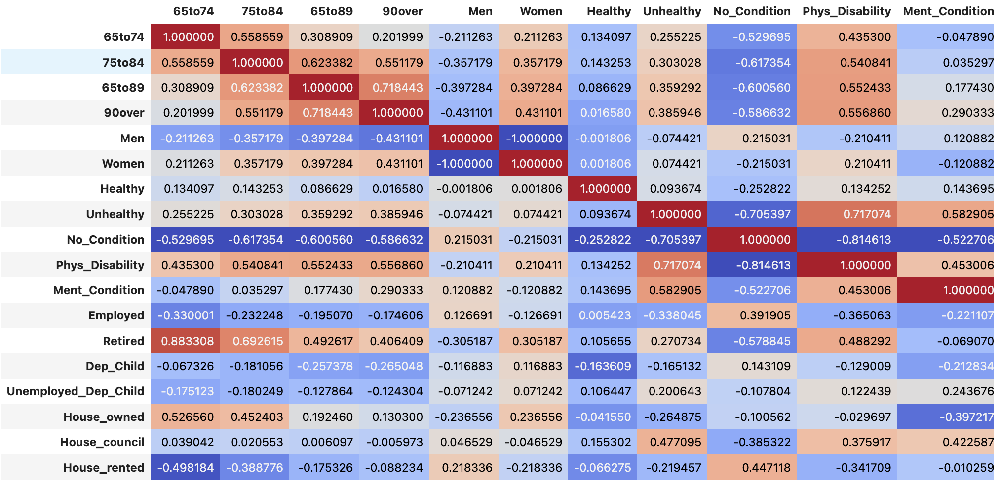

In [ ]:
# only plot variables with > 0.75 correlation
threshold = 0.75 
highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

# heat map to differentiate between highly correlated relationships
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

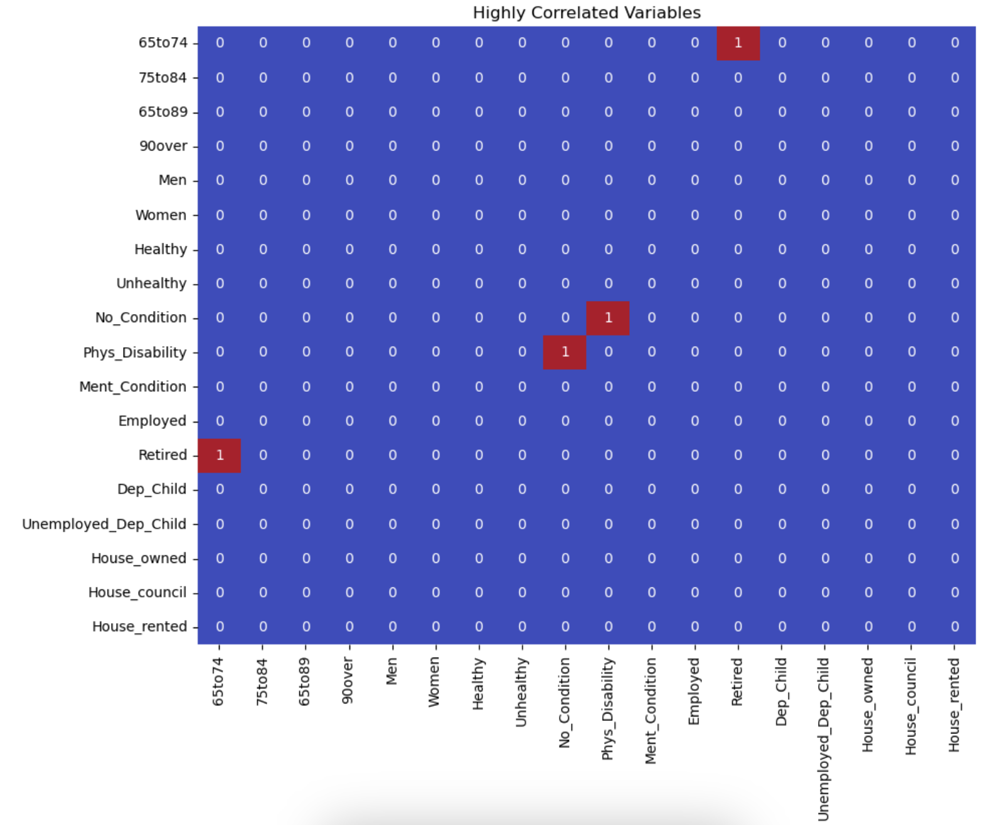

A few variables are highly correlated. These include 65to74 and Retired and No_Condition and Phys_Disability.

Both of these make sense as 1) retirement age in the UK is 65 and 2) households will be listed as no condition if a  family member had a physical disability. One of each variable will be removed from the analysis.

In [ ]:
# remove highly correlated variables
z_score_df.drop(['No_Condition','65to74'], axis=1, inplace=True)

In [ ]:
# replot the z-value correlations and check for highly correlated variables

corr_2 = z_score_df.corr()
threshold = 0.75
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables Replotted')
plt.show()

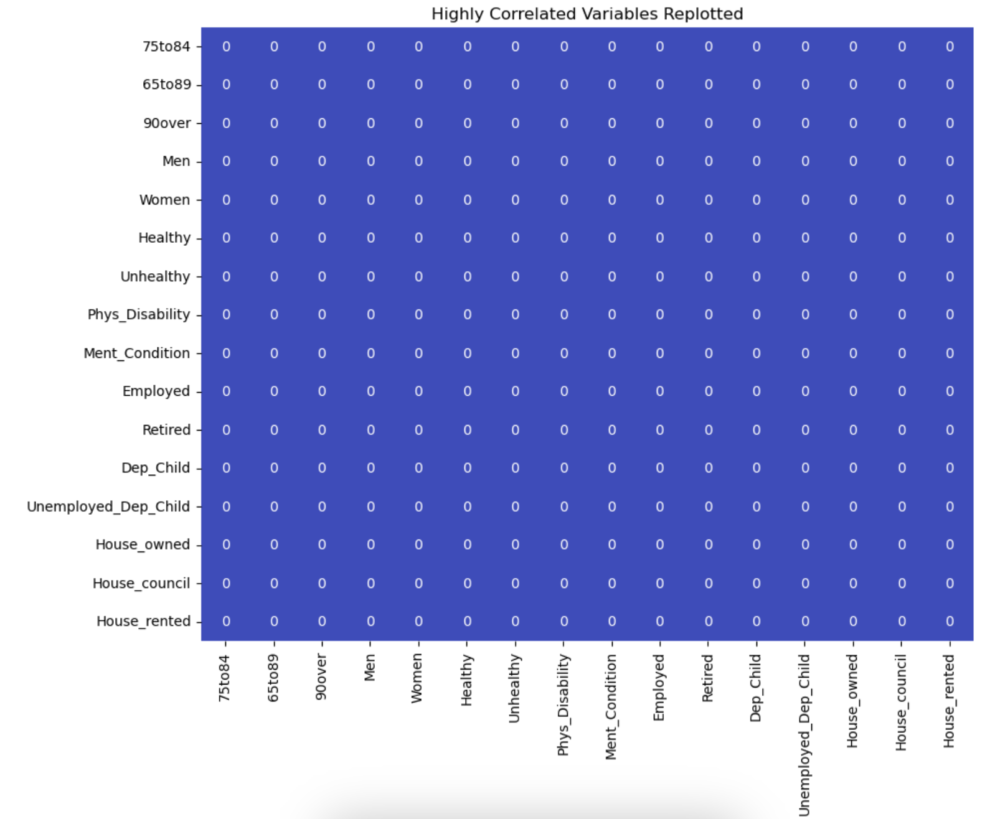

As you can see, there are no longer highly correlated variables. 

In [ ]:
# test dfata for any NaN values. Imputation is used to replace NaN value with the median of the data.

contains_nan = z_score_df.isna().any().any()

if contains_nan:
    print("The DataFrame contains NaN values.")
else:
    print("The dataFrame does not contain NaN values")

z_score_df.fillna(z_score_df.median(), inplace=True)

z_score_df.head()

### 1.7 & 1.8 K-Means Clustering and Elbow Method

#### K-Means Clustering 

The K-Means clustering technique employs a specified number of clusters and aims to minimize the distance between data points and their assigned cluster centroids.

This process initiates by generating a predetermined number of seeds randomly distributed. Each data point is then assigned to its nearest seed. Subsequently, a new seed is placed at the center (centroid) of each cluster, repeating the procedure until the distances between data points and their centroids cannot be further minimized.

The initial phase involves selecting the ideal number of centroids and clusters to ensure that the clusters are as uniform as possible, distinctly separated from one another, and contain roughly equal numbers of data points.

To achieve this, an analysis of the data distribution is conducted.

#### Elbow Method

The optimal cluster count is identified by graphing the squared differences between each observation and its cluster center. A higher sum indicates a more dispersed cluster, signifying greater dissimilarity from other clusters.

By plotting these squared differences against the number of clusters and identifying a pronounced bend in the graph, known as the "elbow," the optimal number of clusters can be determined.

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

In [ ]:
# calculate sum of squared distances for clusters and plot them
Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

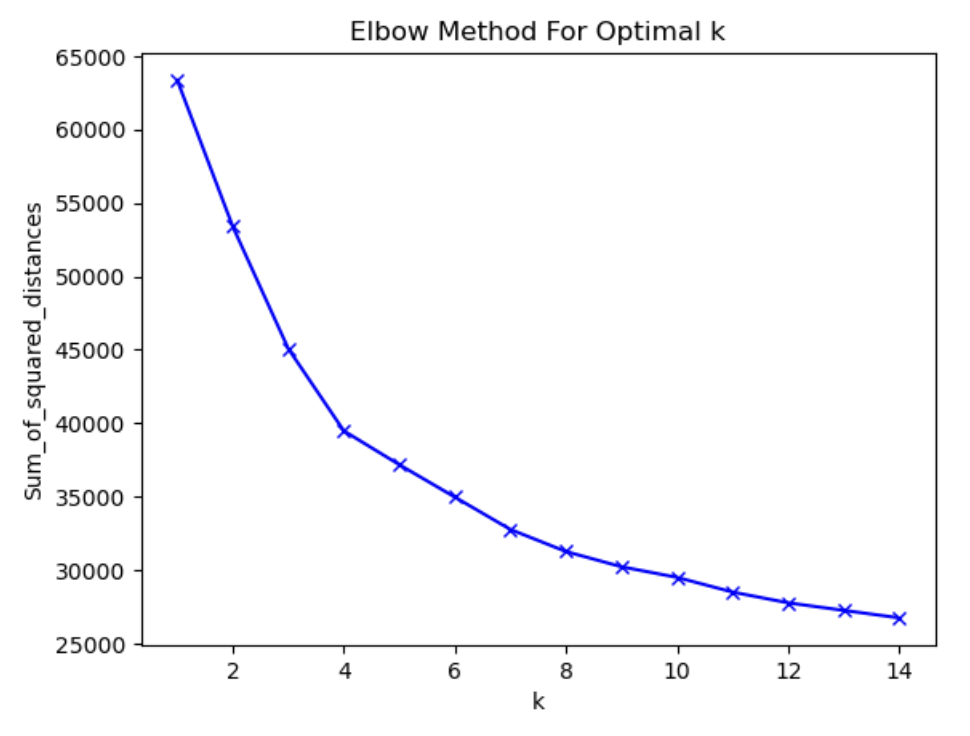

The elbow is shown to be at 6. The data will be clustered into 6 groups using K Means.

In [ ]:
# distribution of datapoints plotted with histogram

kmeans = KMeans(n_clusters=6)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

plt.hist(labels)

This shows an even distribution of datapoints across the six clusters

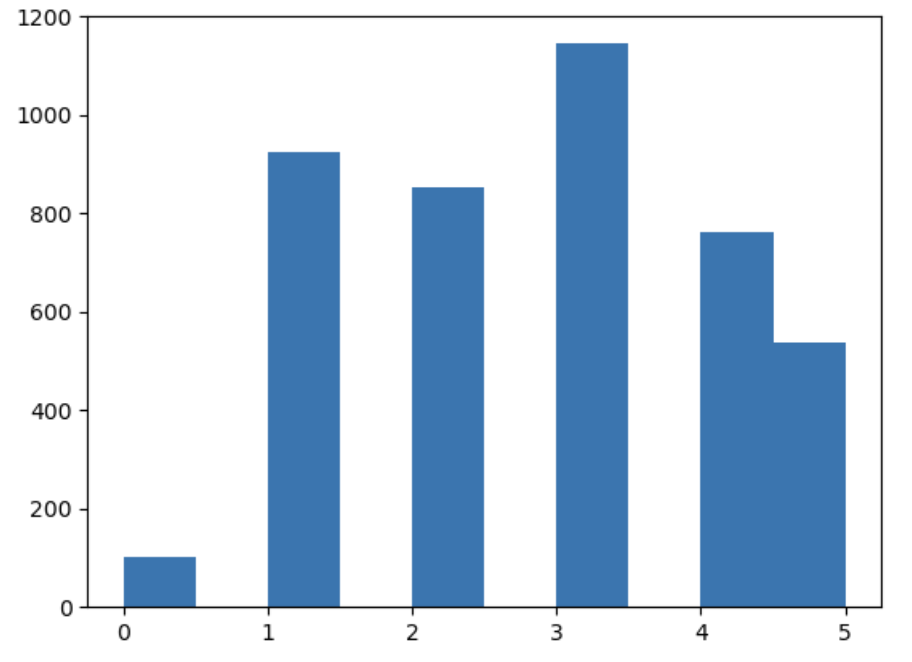

### 1.9 Evaluate and Interpret Cluster Centres

In the subsequent section, data points within each cluster are graphed to illustrate their distribution and observe any overlap between data points from different clusters.

The primary objective here is to map the dataset's structure onto a two-dimensional plane, allowing for the identification of clusters and comprehension of the variability explained by the principal components.

In [ ]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

# remove mean and scales
scaler = StandardScaler()

# standardises z_score_df 
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysis: reduces dimensionality to 2 principle components
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

# percentage of variance explained by each of the selected components
variance_ratio = pca.explained_variance_ratio_

# create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

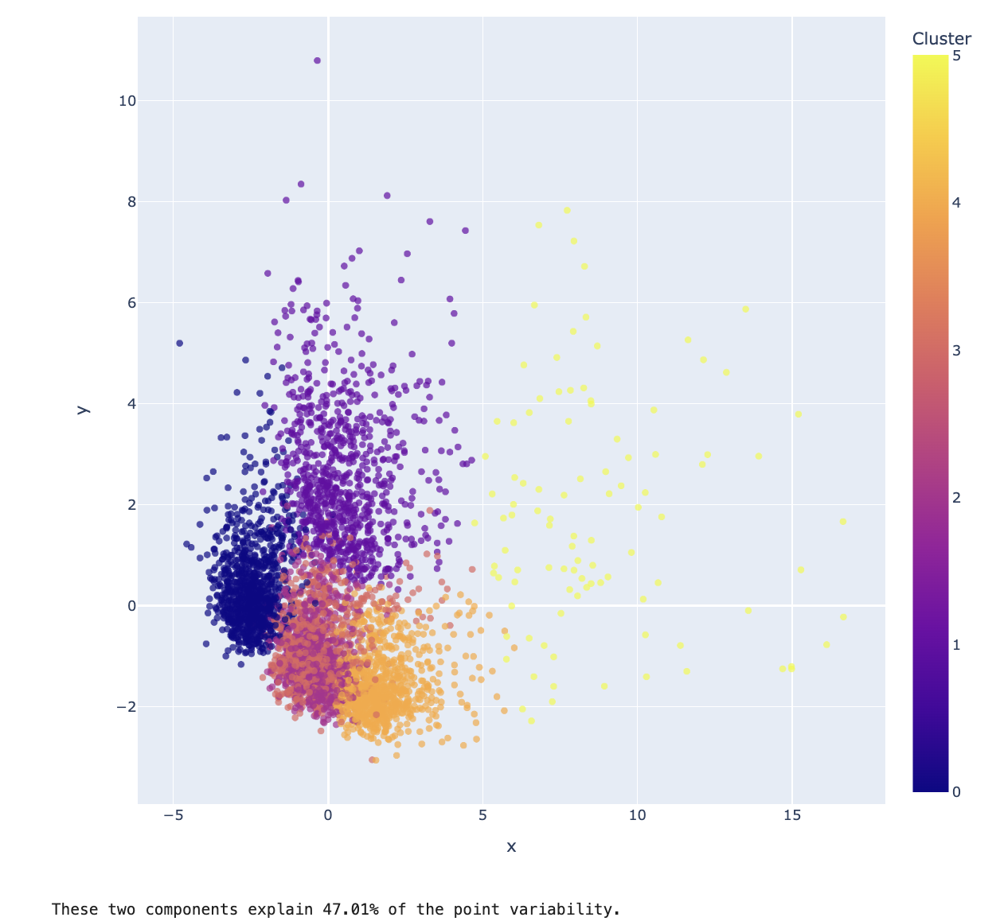

In [ ]:
# apply PCA to reduce the dimensionality to 2 dimensions, and visualizes the clusters 

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

#Standardizes z_score_df 
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysis: Reduces dimentionallity to 2 principle components
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()

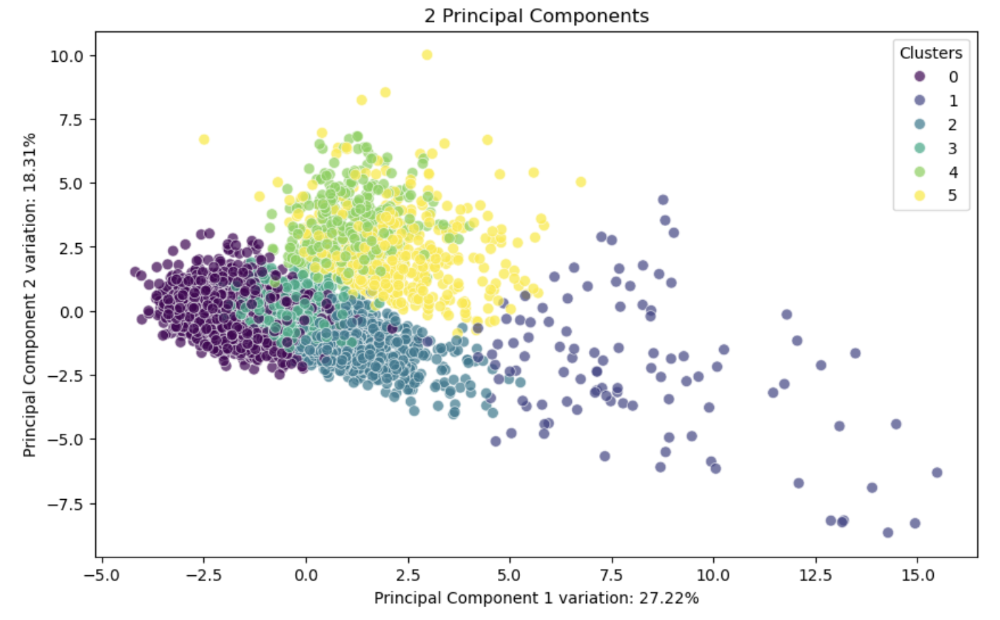

The two components analysed explains ~47% of the point variability. This is also shown through the scatterplots. They show that that across the 6 clusters, they overlap to a mediocre degree. This is because the variables selected explain around half of the patterns shown. 

The cluster centers will now be plotted as radial plots to understand the defining features of each cluster. Note that the clusters vary each time the code is ran, so it is possible your results will differ from the screenshots. This is due to the variability of the k means process. This suggests that the groups should be more distinct to ensure consistency.

The key attributes are typically the variables or dimensions along which the data points in a particular cluster are relatively homogeneous or share similar values, and they differ from those in other clusters. This concept doesn't necessarily imply correlation in the statistical sense between the attributes themselves. Instead, it means that these attributes are significant in grouping the data points. 

However, the process of identifying clusters might indeed leverage correlations among variables to group data points effectively. Clusters are formed based on the similarity of data points across several attributes, which can include examining how variables relate to one another across the dataset. But the fact that certain attributes are key to defining a cluster mainly speaks to their role in the clustering process and the characteristics of the cluster members, rather than implying any specific statistical relationship such as correlation between those key attributes.

In [ ]:
# k-means clustering
kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

# cluster centers
cluster_centers = kmeans.cluster_centers_
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

# create new DataFrame with cluster assignments and column names
result_df = pd.DataFrame({'Cluster': clusters})
cluster_centers.head(6)

### 1.10 Mapping the Final Cluster Groups

In [ ]:
import numpy as np

In [ ]:
# plot cluster group 1

# define the row being analysed
first_row_centers = cluster_centers.iloc[0, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

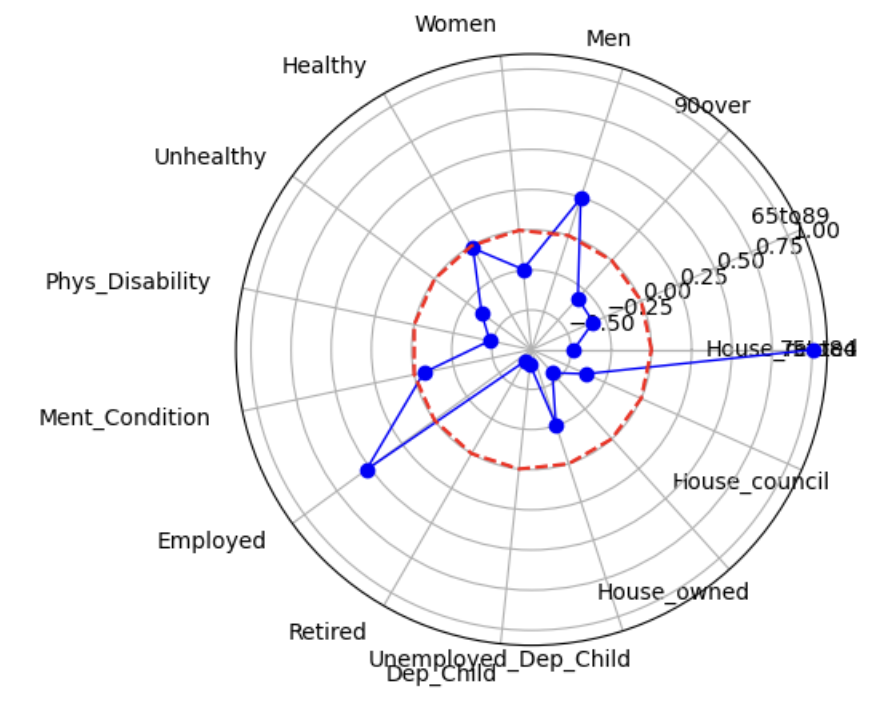

This cluster seems to represent a group of elderly individuals who are likely independent due to home ownership and are in the older age brackets, suggesting a tailored approach to healthcare that includes preventative measures, chronic disease management, and mobility services. Moreover, since they are home-owners, there may be a greater capacity for in-home care and less of a need for community-based services.

In [ ]:
# plot cluster group 2

# define the row being analysed
first_row_centers = cluster_centers.iloc[1, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

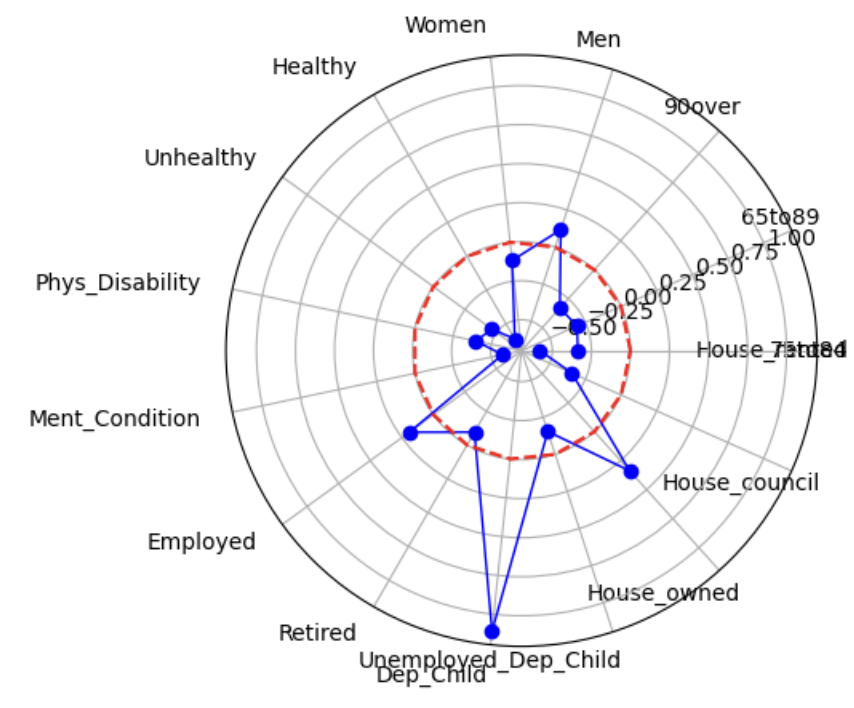

In terms of informing elderly healthcare services, this analysis suggests that this cluster may have lower immediate needs for healthcare services related to physical disabilities and mental health conditions but may benefit from preventative health services and social support programs, especially considering their housing situation. Additionally, the absence of younger seniors and the lower number of very elderly individuals (over 90) may suggest a need for services that are tailored to the 'young old' who may be transitioning into more typical elderly needs.

In [ ]:
# plot cluster group 3

# define the row being analysed
first_row_centers = cluster_centers.iloc[2, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

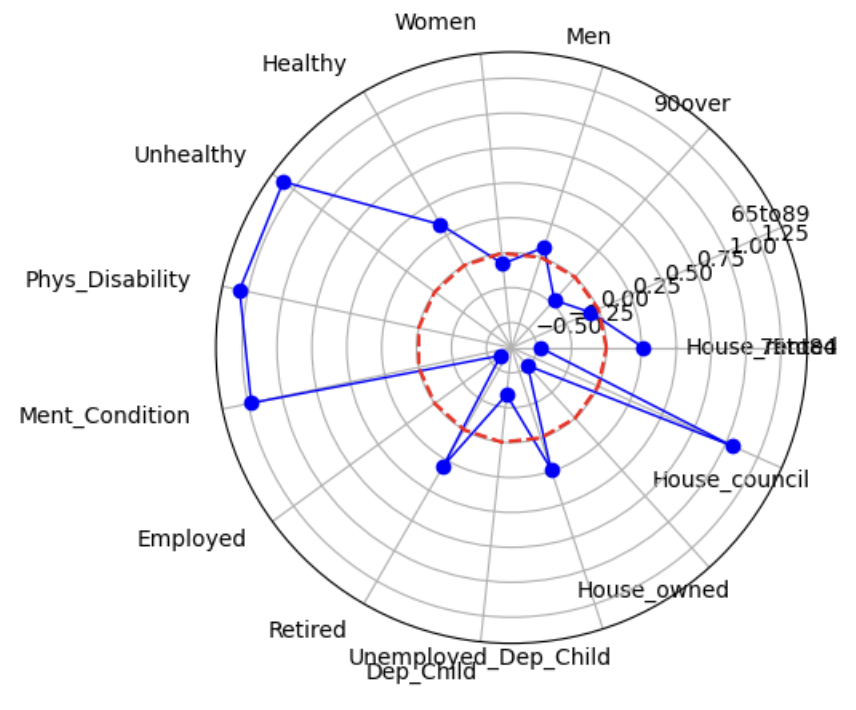

This analysis suggests that the data between mental condition, physical disability, unhealthy, and council homes are highly similar. This suggests that those living in council homes will require the most healthcare services since they are the ones that have the most health issues. That said, this cluster does not show that much information related to age, which means that it does not necessarily mean that it is elderly that will be in this cluster. This is still important to note since it means local authorities will need to think about where to invest in healthcare, and if council homes is the variable that makes the most difference.

In [ ]:
# plot cluster group 4

# define the row being analysed
first_row_centers = cluster_centers.iloc[3, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

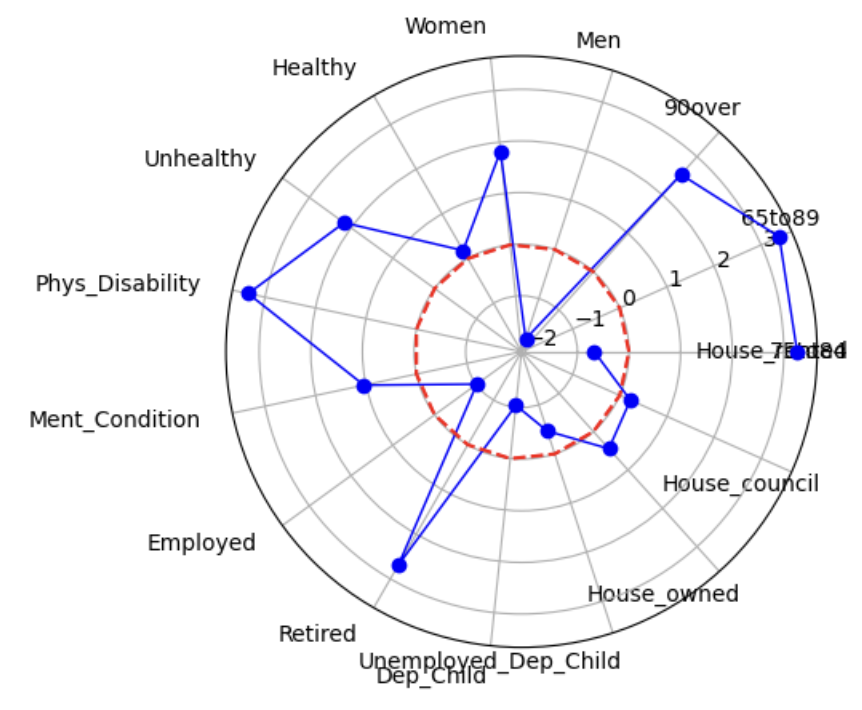

This cluster shows that the key attributes are associated with health, age, and retirement. This makes sense since the retirement age in the UK is 65, which means that in areas with an ageing population, it is likely that the retirement population is also greater. What is interesting is that this does not show council homes as a key attribute compared to the previous cluster. This could suggest that this is an area withotu council homes. For informing elderly healthcare services, this shows that physical disabilities is generally related to age and retirement, which means that healthcare services should focus on supporting the elderly with physical disabilities.

In [ ]:
# plot cluster group 5

# define the row being analysed
first_row_centers = cluster_centers.iloc[4, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

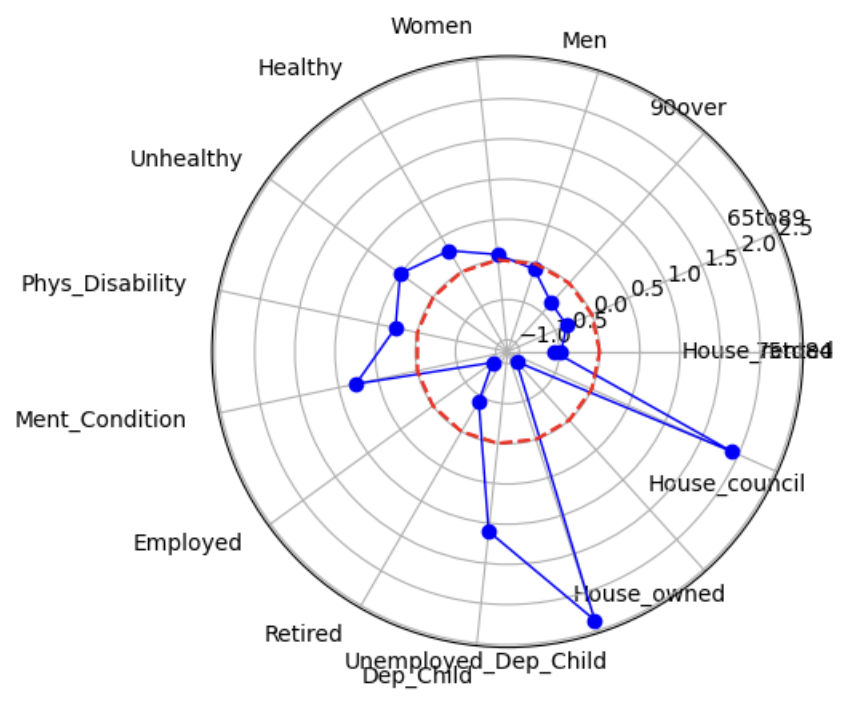

This cluster shows key attributes of mental conditions, council homes, and owned homes. This is interesting since I would think that owned homes and council homes would tend to be very dissimilar due to the economic conditions associated with either. This shows that it is important to note that mental conditions may be less related to economic conditions, but associated with another variable that is not shown here. This suggests that healthcare services should focus mental condition support in both economically struggling and winning areas. 

In [ ]:
# plot cluster group 6

# define the row being analysed
first_row_centers = cluster_centers.iloc[5, :-1]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

# Add red line at 0.0
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns[:-1], rotation=45, ha='right')

plt.show()

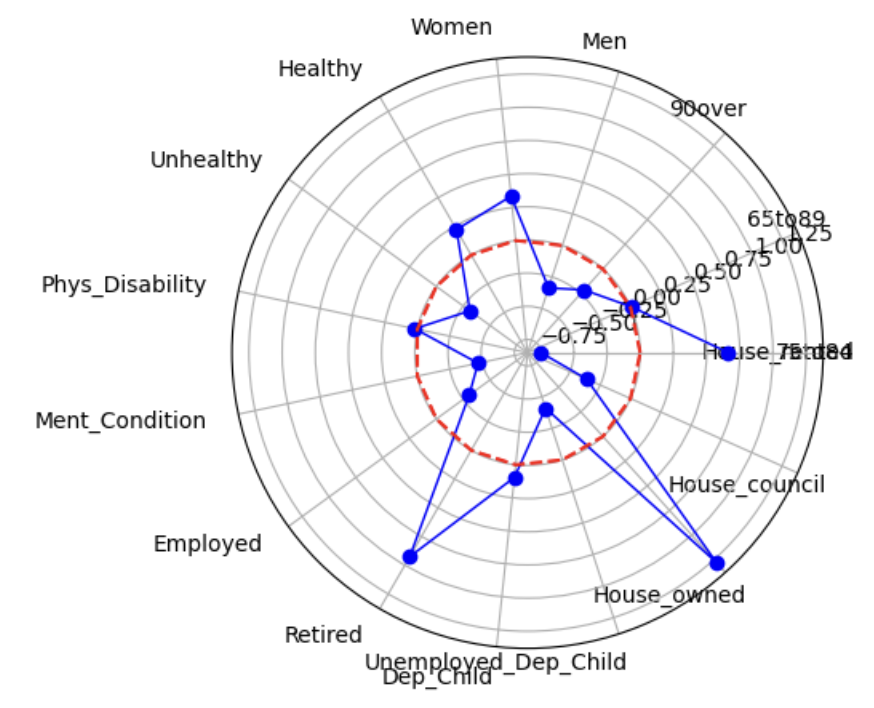

This final cluster shows a relatino between retirement and owned homes. This tends to make sense since age and economic factors are correlated. This is due to the fact that as people age, they are able to work for longer, saving more money and purchase homes. This is important to note since it means healthcare services should be increased in residential areas where there will be a greater elderly population. 

### 1.11 Plotting the Final Map

In [ ]:
# drop all the variables apart from the cluster and ID data to avoid duplicating data

z_score_df.drop([
'75to84',
'65to89',
'90over',
'Men',
'Women',
'Healthy',
'Unhealthy',
'Phys_Disability',
'Ment_Condition',
'Employed',
'Retired',
'Dep_Child',
'Unemployed_Dep_Child',
'House_owned',
'House_council',
'House_owned',
'House_rented'], axis=1, inplace=True)
z_score_df.info()

In [ ]:
# link census data and z_score data frame
final_df = pd.concat([edinburgh_census_data, z_score_df], axis=1, ignore_index=False)

In [ ]:
# convert cluster column to string
final_df['Cluster'] = final_df['Cluster'].astype('string')

# create funcion that renames the clusters
def rename_column(x): 
    x = x.replace("0", "Stable Seniors")
    x = x.replace("1", "Struggling Workers")
    x = x.replace("2", "Unhealthy Council Homies")
    x = x.replace("3", "Old & Struggling")
    x = x.replace("4", "Invested Intelligently")
    x = x.replace("5", "Retired & Chilling")
    return x

# run function through the cluster column
final_df['Cluster'] = final_df['Cluster'].apply(rename_column)

In [ ]:
# create interactive map of clusters
final_df.explore(column='Cluster', cmap='Set3', tiles='CartoDB positron')

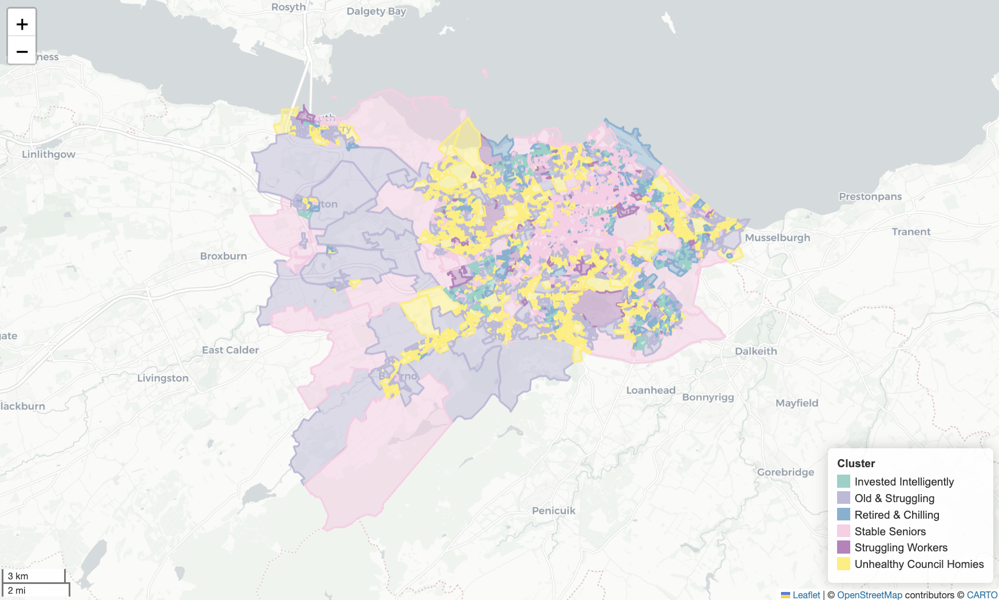

### 1.12 Limitations and Difficulties

In completing the cluster analysis and developing the geodemographic classifications, it's important to acknowledge the subjective elements inherent to this type of analysis. The choices I made were deliberate, aimed at providing an optimal classification to serve the specific objectives of this project. This required a careful balance to avoid overfitting with too many clusters or oversimplifying with too few, ensuring that each category is meaningful and actionable.

Determining the right variables to include was a complex decision that required a consideration of their direct relevance to the study’s aims, while also being mindful of data integrity and avoiding redundancy. Techniques like PCA were utilized to streamline the data, though this also added a layer of complexity to the interpretation of the results.

Spatial considerations also played a critical role, as the analysis needed to account for geographic distributions and avoid potential biases such as those posed by the modifiable areal unit problem. Each decision, from the selection of the clustering algorithm to the determination of cluster numbers, was thoroughly documented, along with a clear rationale grounded in the project’s broader context and goals.

Now that the geodemographic classifications have been established, they offer multiple avenues for application, particularly within the realm of elderly healthcare in Edinburgh. The insights derived can guide healthcare providers in customizing their services to the nuanced needs of the elderly demographic. Furthermore, these classifications provide local authorities with a data-driven foundation for resource allocation and policy development. Beyond healthcare, these insights have the potential to inform urban planning, community programming, and commercial strategies to enhance the well-being and quality of life for the city's elderly residents. The process was as challenging as it was insightful, reinforcing the value of methodical and documented analytical practices.






